<a href="https://colab.research.google.com/github/michaelscheinfeild/3D-Machine-Learning/blob/master/Task1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Michael Scheinfeld

# Find Match

#### import Files to colab

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving task1.nrrd to task1.nrrd


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.metrics import structural_similarity as ssim

In [ ]:
import math

## Read image

In [ ]:
img=cv2.imread('task1.jpg')
img.shape

(394, 482, 3)

Text(0.5, 1.0, '2D image')

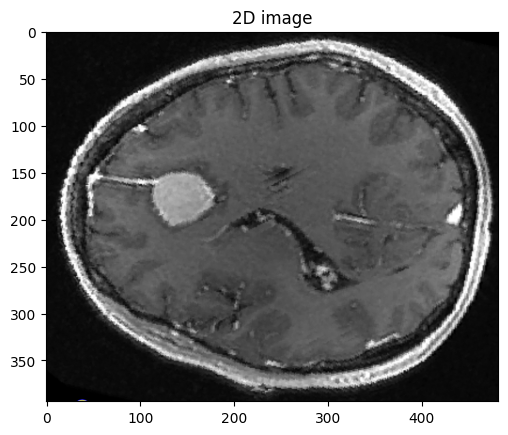

In [ ]:
plt.imshow(img)
plt.title('2D image')

## Read nrrd

https://en.wikipedia.org/wiki/Nrrd

nearly raw raster data

In [ ]:
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

'en_US.UTF-8'

In [ ]:
!pip install pynrrd

In [ ]:
import nrrd

In [ ]:
# Read the data back from file
readdata, header = nrrd.read('task1.nrrd')
print(readdata.shape)
print(header)

(256, 256, 112)
OrderedDict([('type', 'short'), ('dimension', 3), ('space', 'left-posterior-superior'), ('sizes', array([256, 256, 112])), ('space directions', array([[0.9375, 0.    , 0.    ],
       [0.    , 0.9375, 0.    ],
       [0.    , 0.    , 1.4   ]])), ('kinds', ['domain', 'domain', 'domain']), ('endian', 'little'), ('encoding', 'gzip'), ('space origin', array([-119.531, -119.531,  -77.7  ]))])


In [ ]:
plt.imshow(readdata[:,:,0],cmap='gray')
plt.title('nrrd0')

## plot channels nrrd

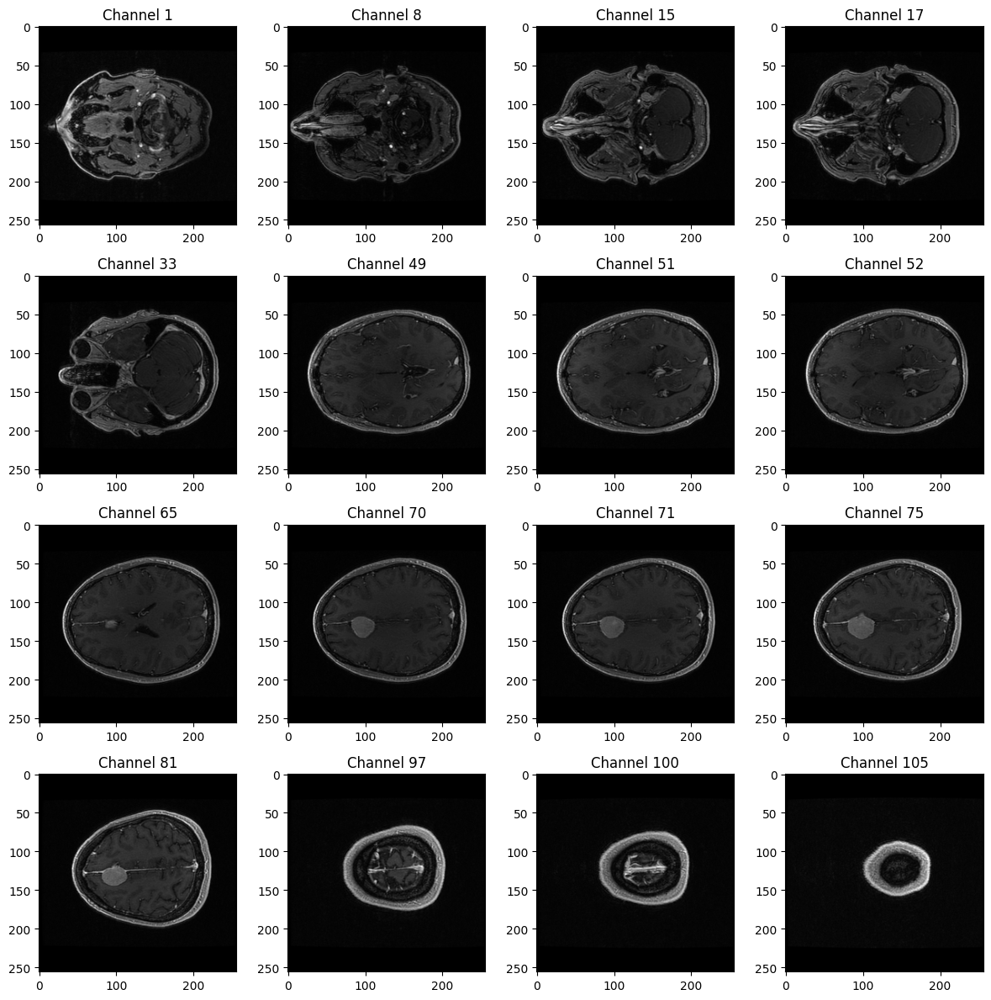

In [ ]:
# Channels you want to select
selected_channels = [1,8, 15,17, 33, 49,51,52, 65,70,71,75, 81, 97,100,105]
# Create a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(12, 12))

# Iterate through the selected channels and plot images
for i, ax in enumerate(axes.flatten()):
    if i < len(selected_channels):
        channel = selected_channels[i]
        ax.imshow(readdata[:, :, channel - 1], cmap='gray')  # -1 because channel numbers start from 1
        ax.set_title(f'Channel {channel}')
    else:
        ax.axis('off')  # Turn off extra subplots if there are fewer than 16 selected channels

# Adjust spacing between subplots
plt.tight_layout()

## view volume

In [ ]:
from os.path import dirname, join
from pprint import pprint
import numpy as np
import ipywidgets as ipyw
import matplotlib.pyplot as plt
import nibabel as nib

class ImageSliceViewer3D:
    """
    ImageSliceViewer3D is for viewing volumetric image slices in jupyter or
    ipython notebooks.

    User can interactively change the slice plane selection for the image and
    the slice plane being viewed.Arguments:
    Volume = 3D input image
    figsize = default(8,8), to set the size of the figure
    cmap = default('gray'), string for the matplotlib colormap. You can find
    more matplotlib colormaps on the following link:
    https://matplotlib.org/users/colormaps.html

    """

    def __init__(self, volume, figsize=(50,50), cmap='gray'):
        self.volume = volume
        self.figsize = figsize
        self.cmap = cmap
        self.v = [np.min(volume), np.max(volume)]

        # Call to select slice plane
        ipyw.interact(self.views)

    def views(self):
        self.vol1 = np.transpose(self.volume, [1,2,0])
        self.vol2 = np.rot90(np.transpose(self.volume, [2,0,1]), 3) #rotate 270 degrees
        self.vol3 = np.transpose(self.volume, [0,1,2])
        maxZ1 = self.vol1.shape[2] - 1
        maxZ2 = self.vol2.shape[2] - 1
        maxZ3 = self.vol3.shape[2] - 1
        ipyw.interact(self.plot_slice,
            z1=ipyw.IntSlider(min=0, max=maxZ1, step=1, continuous_update=False,
            description='Axial:'),
            z2=ipyw.IntSlider(min=0, max=maxZ2, step=1, continuous_update=False,
            description='Coronal:'),
            z3=ipyw.IntSlider(min=0, max=maxZ3, step=1, continuous_update=False,
            description='Sagittal:'))

    def plot_slice(self, z1, z2, z3):
        # Plot slice for the given plane and slice
        f,ax = plt.subplots(1,3, figsize=self.figsize)
        #print(self.figsize)
        #self.fig = plt.figure(figsize=self.figsize)
        #f(figsize = self.figsize)
        ax[0].imshow(self.vol1[:,:,z1], cmap=plt.get_cmap(self.cmap),
            vmin=self.v[0], vmax=self.v[1])
        ax[1].imshow(self.vol2[:,:,z2], cmap=plt.get_cmap(self.cmap),
            vmin=self.v[0], vmax=self.v[1])
        ax[2].imshow(self.vol3[:,:,z3], cmap=plt.get_cmap(self.cmap),
            vmin=self.v[0], vmax=self.v[1])
        plt.show()

In [ ]:
ImageSliceViewer3D(readdata)

In medical imaging and 3D visualization, the terms "Axial," "Coronal," and "Sagittal" are used to describe specific planes or views of a three-dimensional volume or dataset. These terms are commonly used in medical imaging such as CT (computed tomography) and MRI (magnetic resonance imaging) to refer to different cross-sectional views of the body.

    Axial Plane (Transverse Plane): The axial plane is a horizontal plane that divides the body into upper and lower portions. When looking at a medical image, the axial view is as if you are looking down at the patient from the top. This view is useful for assessing structures like organs and tissues from the top-down perspective.

    Coronal Plane (Frontal Plane): The coronal plane is a vertical plane that divides the body into front and back portions. In medical imaging, the coronal view is as if you are looking at the patient from the front. It is often used to visualize structures from the front-to-back perspective.

    Sagittal Plane: The sagittal plane is also a vertical plane, but it divides the body into left and right portions. The sagittal view is as if you are looking at the patient from the side. There can be both "sagittal" and "mid-sagittal" views, where the mid-sagittal view precisely divides the body into equal left and right halves.

These planes or views are essential for medical professionals to understand and interpret medical images, and they help in visualizing anatomical structures and abnormalities from different angles. In 3D viewers, you can typically switch between these views to get a better understanding of the three-dimensional data in a clinical context.

# Detect shape blob

The task of this is to detect center of each slice so we can check against this matchig

### clean image small blobs

Text(0.5, 1.0, 'ch1')

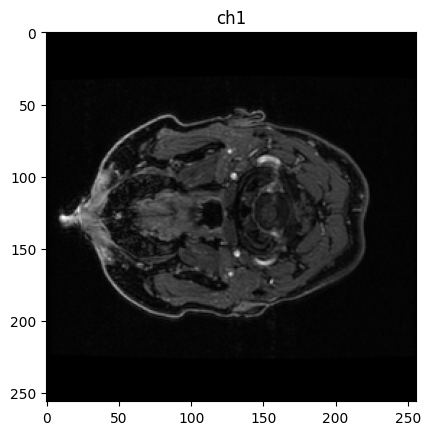

In [ ]:
image1=readdata[:,:,1]
plt.imshow(image1,cmap='gray')
plt.title('ch1')

Text(0.5, 1.0, 'blur')

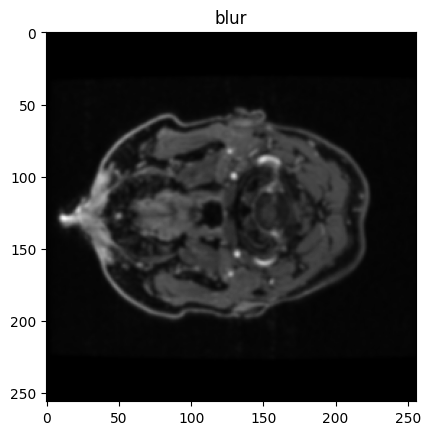

In [ ]:
# Apply Gaussian blur to reduce noise (adjust the kernel size as needed)
blurred = cv2.GaussianBlur(image1, (5, 5), 0)
plt.imshow(blurred,cmap='gray')
plt.title('blur')

In [ ]:
blurred.dtype

In [ ]:
# Ensure the image is of type uint8
blurred = cv2.convertScaleAbs(blurred)

In [ ]:
# Perform thresholding to create a binary image
_, thresholded = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

In [ ]:
plt.imshow(thresholded,cmap='gray')
plt.title('thresholded image')

Text(0.5, 1.0, 'closed')

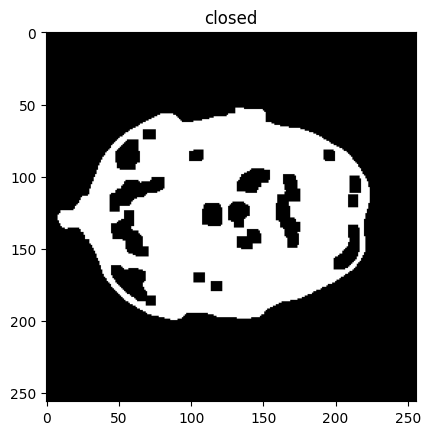

In [ ]:
# Fill holes in the thresholded image using morphological closing
kernel = np.ones((7, 7), np.uint8)
closed = cv2.morphologyEx(thresholded, cv2.MORPH_CLOSE, kernel)
plt.imshow(closed,cmap='gray')
plt.title('closed')

Text(0.5, 1.0, 'cleaned_image')

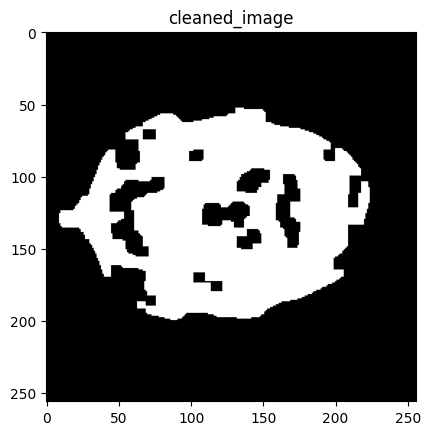

In [ ]:
# Define a kernel for morphological operations (adjust the size as needed)
kernel = np.ones((3, 3), np.uint8)

# Perform morphological opening to remove small areas
cleaned_image = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=2)
plt.imshow(cleaned_image,cmap='gray')
plt.title('cleaned_image')

Text(0.5, 1.0, 'clean mask by area')

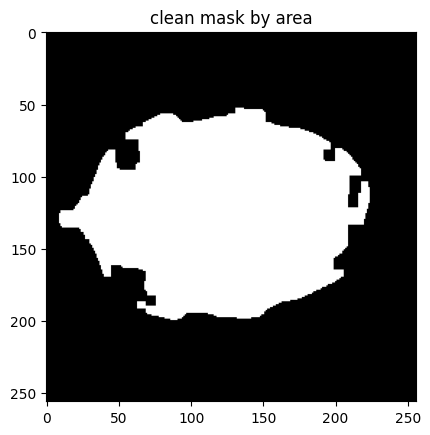

In [ ]:
# Find contours in the binary image
contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Set a minimum area threshold for cleaning (adjust as needed)
min_area_threshold = 100  # You can change this value

# Create a mask to keep only the blobs with an area above the threshold
cleaned_mask = np.zeros_like(cleaned_image)

for contour in contours:
    area = cv2.contourArea(contour)
    if area >= min_area_threshold:
        cv2.drawContours(cleaned_mask, [contour], 0, 255, -1)

# Display the cleaned binary image
plt.imshow(cleaned_mask,cmap='gray')
plt.title('clean mask by area')

### Take largest blob

In [ ]:
# Find contours in the binary image
contours, _ = cv2.findContours(cleaned_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Initialize variables to store information about the largest blob
largest_area = 0
largest_contour = None

In [ ]:
# Iterate through the contours to find the largest one
for contour in contours:
    area = cv2.contourArea(contour)
    if area > largest_area:
        largest_area = area
        largest_contour = contour

In [ ]:
largest_area

20894.5

In [ ]:
from google.colab.patches import cv2_imshow

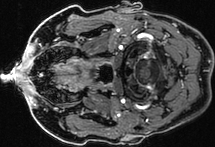

In [ ]:
# Check if a largest blob was found
if largest_contour is not None:
    # Create a mask for the largest blob
    largest_blob_mask = np.zeros_like(cleaned_mask)
    cv2.drawContours(largest_blob_mask, [largest_contour], 0, 255, -1)

    # Find the bounding box of the largest blob
    x, y, w, h = cv2.boundingRect(largest_contour)

    # Crop the original image to a new image containing only the largest blob
    # Load your original image (replace 'original_image.jpg' with your actual image file path)
    original_image = image1
    cropped_image = original_image[y:y+h, x:x+w]

    # Display the cropped image
    cv2_imshow(cropped_image)

else:
    print("No largest blob found in the binary image.")

## Full function to crop

In [ ]:
def cropImageBlob(imgIn,plot_flag=False):

  # Apply Gaussian blur to reduce noise (adjust the kernel size as needed)
  blurred = cv2.GaussianBlur(imgIn, (5, 5), 0)

  if plot_flag:
    plt.figure()
    plt.imshow(blurred,cmap='gray')
    plt.title('blur')

  # Ensure the image is of type uint8
  blurred = cv2.convertScaleAbs(blurred)

  # Perform thresholding to create a binary image
  _, thresholded = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

  if plot_flag:
    plt.figure()
    plt.imshow(thresholded,cmap='gray')
    plt.title('thresholded image')


  # Fill holes in the thresholded image using morphological closing
  kernel = np.ones((7, 7), np.uint8)
  closed = cv2.morphologyEx(thresholded, cv2.MORPH_CLOSE, kernel)

  if plot_flag:
    plt.figure()
    plt.imshow(closed,cmap='gray')
    plt.title('closed')


  # Define a kernel for morphological operations (adjust the size as needed)
  kernel = np.ones((3, 3), np.uint8)

  # Perform morphological opening to remove small areas
  #cleaned_image = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=2)

  #if plot_flag:
  #  plt.figure()
  #  plt.imshow(cleaned_image,cmap='gray')
  #  plt.title('cleaned_image')


  # Find contours in the binary image
  #cleaned_image
  contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Set a minimum area threshold for cleaning (adjust as needed)
  min_area_threshold = 100  # You can change this value

  # Create a mask to keep only the blobs with an area above the threshold
  cleaned_mask = np.zeros_like(closed)#cleaned_image)

  for contour in contours:
    area = cv2.contourArea(contour)
    if area >= min_area_threshold:
        cv2.drawContours(cleaned_mask, [contour], 0, 255, -1)

  # Display the cleaned binary image
  if plot_flag:
    plt.figure()
    plt.imshow(cleaned_mask,cmap='gray')
    plt.title('clean mask by area')


  # Find contours in the binary image
  contours, _ = cv2.findContours(cleaned_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Initialize variables to store information about the largest blob
  largest_area = 0
  largest_contour = None
  # Iterate through the contours to find the largest one

  for contour in contours:
    area = cv2.contourArea(contour)
    if area > largest_area:
        largest_area = area
        largest_contour = contour


    # Check if a largest blob was found
  if largest_contour is not None:
      # Create a mask for the largest blob
      largest_blob_mask = np.zeros_like(cleaned_mask)
      cv2.drawContours(largest_blob_mask, [largest_contour], 0, 255, -1)

      # Find the bounding box of the largest blob
      x, y, w, h = cv2.boundingRect(largest_contour)

      # Crop the original image to a new image containing only the largest blob
      # Load your original image (replace 'original_image.jpg' with your actual image file path)
      original_image = imgIn
      cropped_image = original_image[y:y+h, x:x+w]

      # Display the cropped image
      if plot_flag:
          plt.figure()
          plt.imshow(cropped_image,cmap='gray')
          plt.title('cropped_image')

      return     cropped_image

  else:
     print("No largest blob found in the binary image.")
     return img

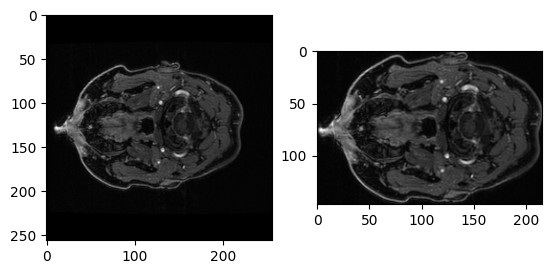

In [ ]:
cropimg=cropImageBlob(image1,plot_flag=False)


plt.figure()
plt.subplot(1, 2, 1)
plt.imshow(image1,cmap='gray')
plt.subplot(1, 2, 2)
plt.imshow(cropimg,cmap='gray')

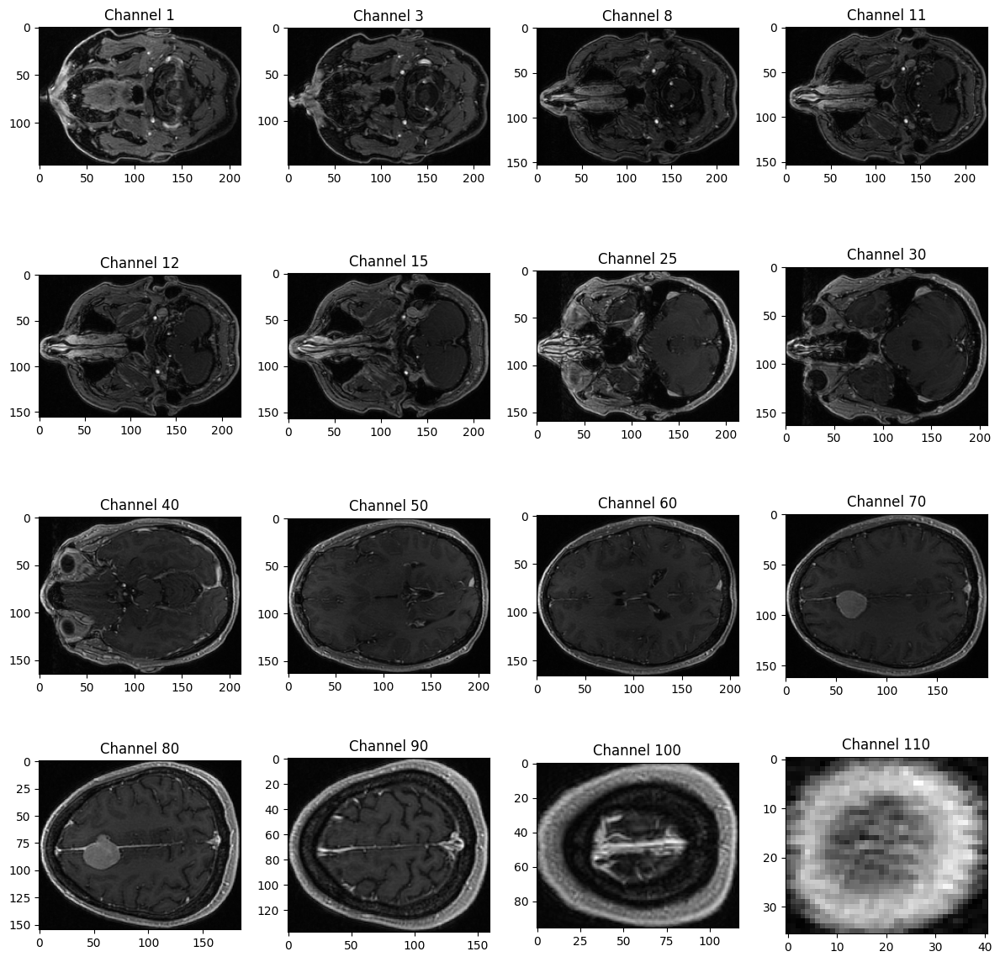

In [ ]:
# Channels you want to select
selected_channels = [1, 3, 8, 11,12, 15, 25, 30,40,50,60,70,80,90,100,110]
# Create a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(12, 12))

# Iterate through the selected channels and plot images
for i, ax in enumerate(axes.flatten()):
    if i < len(selected_channels):
        channel = selected_channels[i]
        imgcrop = cropImageBlob(readdata[:, :, channel - 1])
        ax.imshow(imgcrop, cmap='gray')  # -1 because channel numbers start from 1
        ax.set_title(f'Channel {channel}')
    else:
        ax.axis('off')  # Turn off extra subplots if there are fewer than 16 selected channels

# Adjust spacing between subplots
plt.tight_layout()

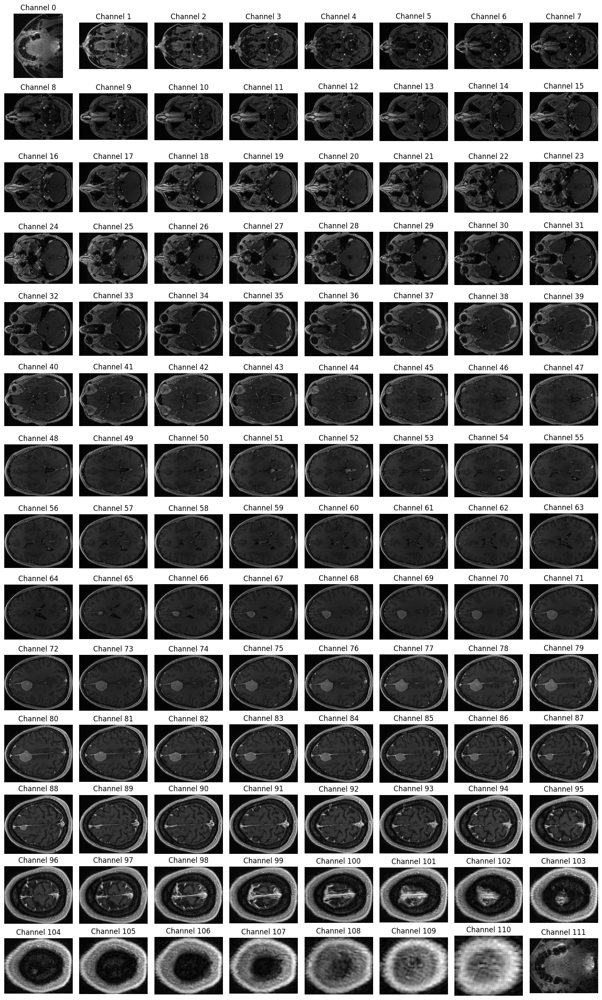

In [ ]:
# Create a 14x8 grid for displaying the images
num_rows = 14
num_cols = 8

# Set the figure size based on the number of rows and columns
fig, axarr = plt.subplots(num_rows, num_cols, figsize=(18, 30))

# Iterate through the channels and plot each 256x256 image
for channel in range(readdata.shape[2]):
    row = channel // num_cols
    col = channel % num_cols

    # Extract the 256x256 image for the current channel
    imgcrop = cropImageBlob(readdata[:, :, channel - 1])

    # Display the image in the corresponding subplot
    axarr[row, col].imshow(imgcrop, cmap='gray')
    axarr[row, col].axis('off')
    axarr[row, col].set_title(f'Channel {channel}')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.1)

 # channel sum

In [ ]:
# Calculate the sum for each channel along the first two dimensions
channel_sums = np.sum(readdata, axis=(0, 1))
channel_sums.shape

(112,)

Text(0, 0.5, 'Sum')

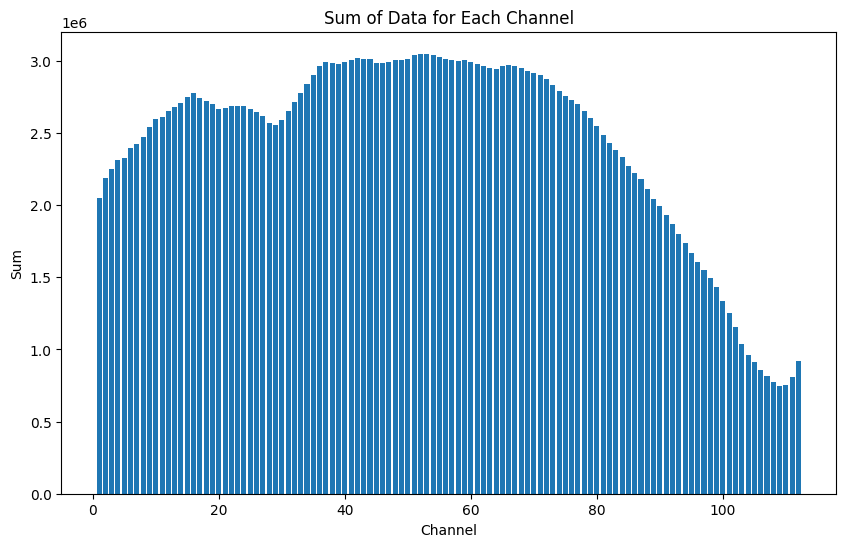

In [ ]:
# Create a bar chart to visualize the sums for each channel
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(range(1, 113), channel_sums)  # Assuming 1-based channel numbering
plt.title('Sum of Data for Each Channel')
plt.xlabel('Channel')
plt.ylabel('Sum')

Text(0.5, 1.0, 'test')

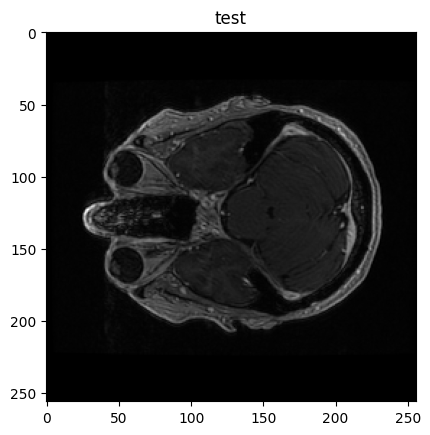

In [ ]:
testimg=readdata[:, :, 32]
plt.imshow(testimg,cmap='gray')
plt.title('test')

#Similarity

(394, 482)
(379, 463)


Text(0.5, 1.0, 'org cropped')

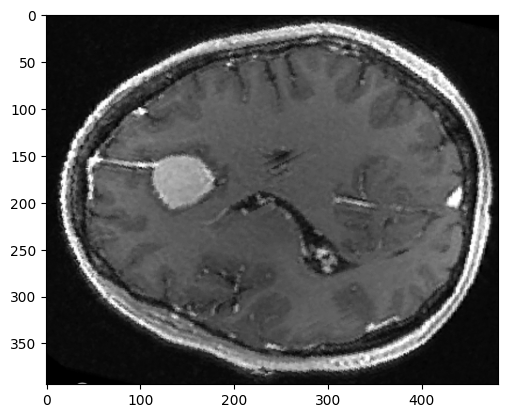

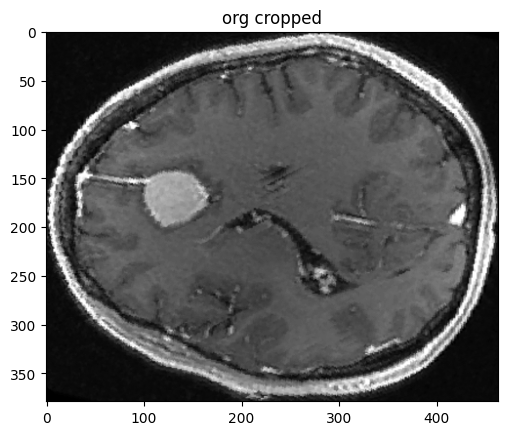

In [ ]:
#crop input image
img=cv2.imread('task1.jpg',cv2.IMREAD_GRAYSCALE)
print(img.shape)
plt.figure()
plt.imshow(img,cmap='gray')
imgOrg=cropImageBlob(img)
print(imgOrg.shape)
plt.figure()
plt.imshow(imgOrg,cmap='gray')
plt.title('org cropped')

Using SIFT (Scale-Invariant Feature Transform) features is a robust way to find key features and match images while considering rotation and translation changes

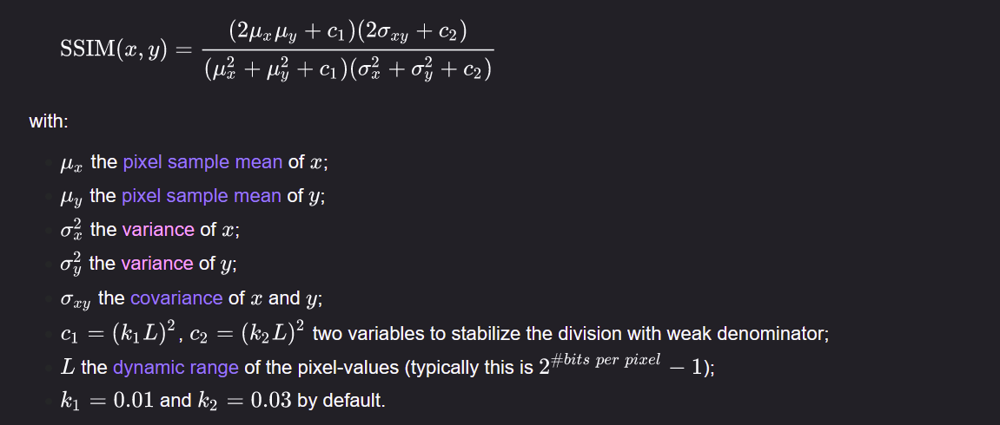

*The required similarity function ("semi-norm") should allow for minor (+-10%) changes in scaling, rotation, and translation. In addition, it should take into account possible changes in the brightness of the image*

In [ ]:
def get_score(image_target,image_reference,plot_flag=False):

  # Convert the image to 8-bit unsigned integer format (CV_8U)
  image_reference = image_reference.astype(np.uint8)
  image_target = image_target.astype(np.uint8)


  # scaling
  heightRef,widthRef= image_reference.shape
  heightTarget,widthTarget= image_target.shape


  resized_image_ref = cv2.resize(image_reference, (image_target.shape[1],image_target.shape[0]), interpolation=cv2.INTER_LINEAR)

  if(plot_flag):
    plt.figure()
    plt.imshow(resized_image_ref,cmap='gray')
    plt.title('ref resized')


  # brightness 10% - cant work here since mean 78 andd all  48-58 ~
  #meanImgRef = np.mean(resized_image_ref[resized_image_ref>0])
  #meanImgTar = np.mean(image_target[image_target>0])

  # Calculate the tolerance for both mean values
  tolerance = 0.10  # 10% tolerance

  # Calculate the upper and lower bounds of the tolerance range
  #upper_bound = meanImgTar * (1 + tolerance)
  #lower_bound = meanImgTar * (1 - tolerance)

  # Check if the mean value of the target image is within the tolerance range
  #if (meanImgRef< lower_bound) or (meanImgRef > upper_bound):
  #  print(meanImgTar,meanImgRef)
  #  return -1


  # Initialize SIFT detector
  sift = cv2.SIFT_create()

  # Find the keypoints and descriptors in both images
  keypoints_reference, descriptors_reference = sift.detectAndCompute(resized_image_ref, None)
  keypoints_target, descriptors_target = sift.detectAndCompute(image_target, None)

  # Initialize a brute-force matcher
  bf = cv2.BFMatcher()

  #Match the descriptors between the reference and target images
  matches = bf.knnMatch(descriptors_reference, descriptors_target, k=2)

  # Apply Lowe's ratio test to filter good matches
  good_matches = []
  thDist=0.8

  for m, n in matches:
    if m.distance < thDist * n.distance:
        good_matches.append(m)

  # Minimum number of matches required for a valid transformation
  min_matches = 10  # Adjust as needed


  # Check if there are enough good matches to estimate transformation
  if len(good_matches) >= min_matches:
      # Extract matched keypoints
      dst_pts = np.float32([keypoints_reference[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
      src_pts = np.float32([keypoints_target[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

      # Estimate the transformation (rotation and translation)
      transformation_matrix, _ = cv2.estimateAffinePartial2D(src_pts, dst_pts)

      # Apply the estimated transformation to the target image
      image_ref_transformed = cv2.warpAffine(resized_image_ref, transformation_matrix, (image_target.shape[1], image_target.shape[0]))

      if plot_flag:
        print(transformation_matrix)
        # Select the top N best matches
        n=np.min([40,len(good_matches)])
        best_matches = sorted(good_matches, key=lambda x: x.distance)[:40]
        img_matches = cv2.drawMatches(image_target, keypoints_reference, image_ref_transformed, keypoints_target, best_matches, None)
        plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))

      a = transformation_matrix[0, 0]
      b = transformation_matrix[0, 1]
      c = transformation_matrix[1, 0]
      d = transformation_matrix[1, 1]

      rotation_angle = np.degrees(np.arctan2(b, a))

      # high rotation
      if(np.abs(rotation_angle)>10):
        return -3

      # Extract the translation components from the transformation matrix
      Tx = transformation_matrix[0, 2]  # Translation along x-axis
      Ty = transformation_matrix[1, 2]  # Translation along y-axis

      # Set the tolerance for translation as 10% of image width and height
      width_tolerance = 0.10 * image_target.shape[0]
      height_tolerance = 0.10 * image_target.shape[1]

      # Check if the translation components are within the tolerance
      if abs(Tx) > width_tolerance or abs(Ty) > height_tolerance:
        return -4


      # Extract the scaling factors from the transformation matrix
      Sx = transformation_matrix[0, 0]
      Sy = transformation_matrix[1, 1]

      # Check if the scaling factors are within 10% of each other
      if abs(Sx - Sy) / max(abs(Sx), abs(Sy)) > tolerance:
        return -5



      # Calculate the SSIM (Structural Similarity Index) between the reference and transformed target images
      ssim_score = ssim(image_target, image_ref_transformed)

      return ssim_score

  else:
     return -2




In [ ]:
#test 1 image
# Initialize SIFT detector
sift = cv2.SIFT_create()

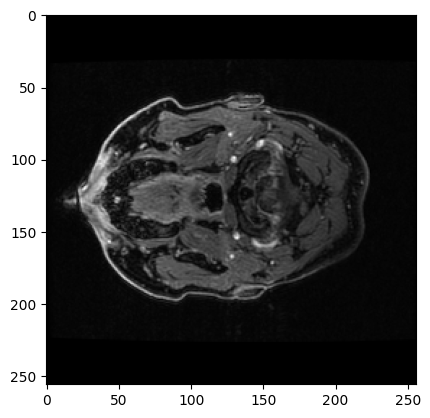

In [ ]:
plt.imshow(readdata[:, :, 0],cmap='gray')

### check crop

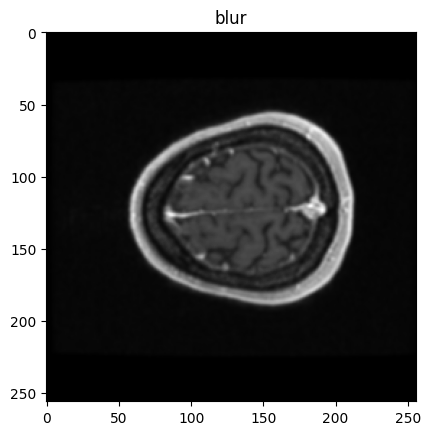

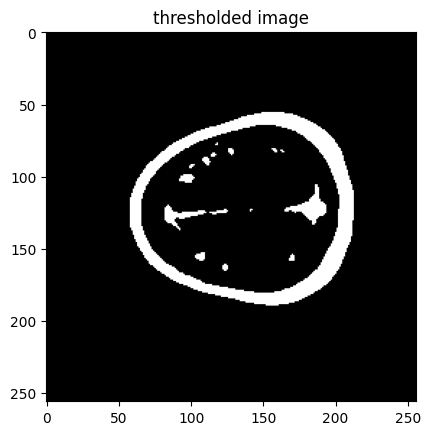

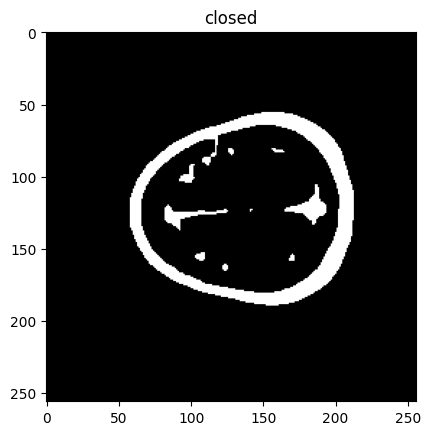

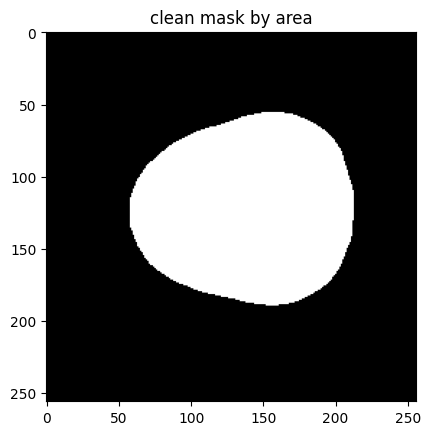

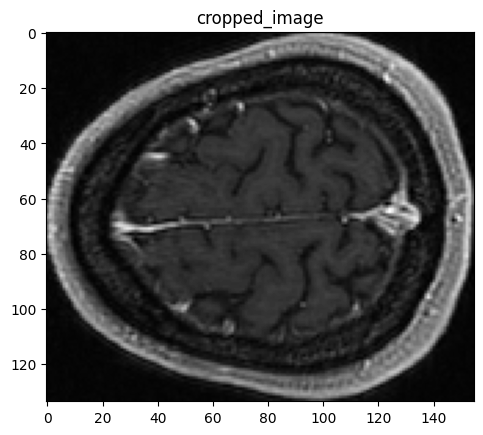

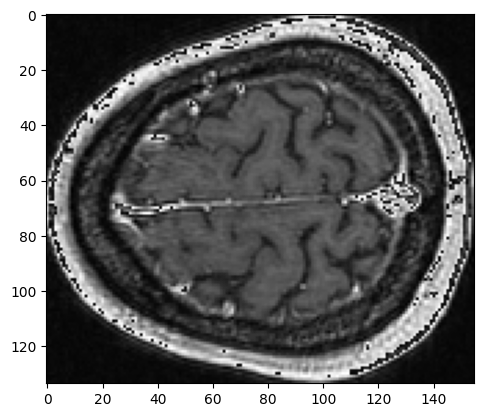

In [ ]:
image_reference=cropImageBlob(readdata[:, :, 90],True).astype(np.uint8)
plt.figure()
plt.imshow(image_reference,cmap='gray')

Text(0.5, 1.0, 'target')

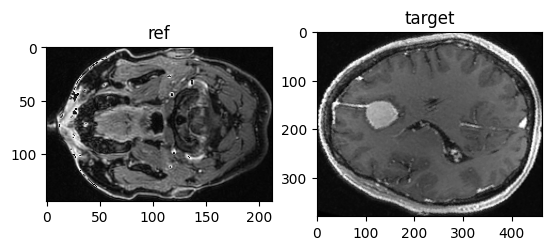

In [ ]:
image_reference=cropImageBlob(readdata[:, :, 0]).astype(np.uint8)
image_target = imgOrg.astype(np.uint8)

plt.figure()
plt.subplot(1, 2, 1)
plt.imshow(image_reference,cmap='gray')
plt.title('ref')
plt.subplot(1, 2, 2)
plt.imshow(image_target,cmap='gray')
plt.title('target')


In [ ]:
image_target.shape

(379, 463)

In [ ]:
image_reference.shape

(145, 212)

Text(0.5, 1.0, 'ref resized')

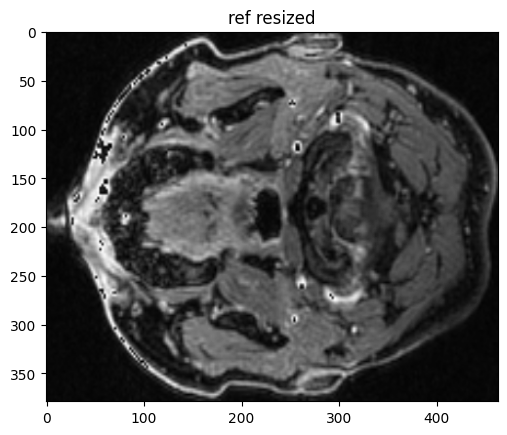

In [ ]:
resized_image_ref = cv2.resize(image_reference, (image_target.shape[1],image_target.shape[0]), interpolation=cv2.INTER_LINEAR)
plt.imshow(resized_image_ref,cmap='gray')
plt.title('ref resized')

In [ ]:
resized_image_ref.shape

(379, 463)

mean image>0

In [ ]:
meanImgRef = np.mean(resized_image_ref[resized_image_ref>0])
meanImgTar = np.mean(image_target[image_target>0])

print(meanImgRef,meanImgTar)

59.867640773434694 77.74394046694385


In [ ]:
# Calculate the tolerance for both mean values
tolerance = 0.10  # 10% tolerance

# Calculate the upper and lower bounds of the tolerance range
upper_bound = meanImgTar * (1 + tolerance)
lower_bound = meanImgTar * (1 - tolerance)

print(lower_bound,upper_bound )

69.96954642024947 85.51833451363825


In [ ]:
condIntensity = (meanImgRef< lower_bound) or (meanImgRef> upper_bound)
condIntensity

True

In [ ]:
resized_image_ref.dtype

dtype('uint8')

In [ ]:
image_target.dtype

dtype('uint8')

In [ ]:
mr,mc=image_target.shape
print(mr,mc)

379 463


In [ ]:
thDist=np.max([mr,mc])*1.5
thDist

694.5

In [ ]:
# Find the keypoints and descriptors in both images
keypoints_reference, descriptors_reference = sift.detectAndCompute(resized_image_ref, None)
keypoints_target, descriptors_target = sift.detectAndCompute(image_target, None)

In [ ]:
# Initialize a brute-force matcher
bf = cv2.BFMatcher()

#Match the descriptors between the reference and target images
matches = bf.knnMatch(descriptors_reference, descriptors_target, k=2)

# Check the number of matches
number_of_matches = len(matches)
print("Number of matches:", number_of_matches)

Number of matches: 1239


In [ ]:
# Apply Lowe's ratio test to filter good matches
good_matches = []
thDist=0.8

for m, n in matches:
    #print(m.distance,n.distance)
    if m.distance < thDist * n.distance:
    #if(n.distance<thDist):
        good_matches.append(m)

In [ ]:
print("Number of good matches:", len(good_matches))

Number of good matches: 18


In [ ]:
# Minimum number of matches required for a valid transformation
min_matches = 10  # Adjust as needed

# Check if there are enough good matches to estimate transformation
#if len(good_matches) >= min_matches:
# Extract matched keypoints
dst_pts = np.float32([keypoints_reference[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
src_pts = np.float32([keypoints_target[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
# Estimate the transformation (rotation and translation)
transformation_matrix, _ = cv2.estimateAffinePartial2D(src_pts, dst_pts)
print(transformation_matrix)

[[-1.18280219e+00  4.40536667e-01  5.40700963e+02]
 [-4.40536667e-01 -1.18280219e+00  3.74713301e+02]]


In [ ]:
import math

In [ ]:


a = transformation_matrix[0, 0]
b = transformation_matrix[0, 1]
c = transformation_matrix[1, 0]
d = transformation_matrix[1, 1]
print(a,b,c,d)

rotation_angle = np.degrees(np.arctan2(b, a))
print(rotation_angle)

# Apply the estimated transformation to the target image
image_reference_transformed = cv2.warpAffine(resized_image_ref  , transformation_matrix, (image_target.shape[1], image_target.shape[0]))

-1.1828021904800576 0.4405366669875385 -0.4405366669875385 -1.1828021904800576
159.5720687268188


In [ ]:
theta = math.atan2(transformation_matrix[1, 0], transformation_matrix[0, 0])
theta

-2.7850579935016637

In [ ]:
print(theta * (180 / math.pi))

In [ ]:
tolerance = 0.10 * abs(theta)

# Check if the rotation angle is within the tolerance range
abs(theta) <= tolerance

In [ ]:
print(abs(theta),tolerance)

In [ ]:
translation = transformation_matrix[:2,2]
translation

In [ ]:
rotation = transformation_matrix[:2,:2]
rotation

In [ ]:
b,a

In [ ]:
plt.imshow(image_reference_transformed,cmap='gray')
plt.title('image_reference_transformed')

In [ ]:
# Select the top 50 best matches
best_matches = sorted(good_matches, key=lambda x: x.distance)[:50]

In [ ]:
img_matches = cv2.drawMatches(image_reference_transformed, keypoints_reference, image_target, keypoints_target, best_matches, None)
width = 14  # Width in inches
height = 10  # Height in inches

# Create a figure with the specified size
plt.figure(figsize=(width, height))
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title('matches best')

In [ ]:
ssim_score = ssim(image_reference_transformed, image_target)
ssim_score

### check sift

In [ ]:
def plot2Images(image1,image2,t1='1',t2='2'):

  plt.figure(figsize=(12, 6))  # Create a figure with a specific size

  # Create the first subplot on the left
  plt.subplot(1, 2, 1)
  plt.imshow(image1,cmap='gray')  # Display the first image
  plt.title(t1)  # Set the title for the first image

  # Load and display the second image (image2)


  # Create the second subplot on the right
  plt.subplot(1, 2, 2)
  plt.imshow(image2,cmap='gray')  # Display the second image
  plt.title(t2)  # Set the title for the second imag

In [ ]:
imgTest = cv2.imread('task1.jpg',cv2.IMREAD_GRAYSCALE)


###Sift function

In [ ]:
def getRotationAngle(transformation_matrix):
     # input Transformation matrix
     # output rotation angle degre

      a = transformation_matrix[0, 0]
      b = transformation_matrix[0, 1]
      c = transformation_matrix[1, 0]
      d = transformation_matrix[1, 1]

      rotation_angle = np.degrees(np.arctan2(b, a))

      return rotation_angle

In [ ]:
def computeAndPlotMatchingSift(imgS,imgT,plot_flag=False):

  # Initialize SIFT detector
  sift = cv2.SIFT_create()

  # Find the keypoints and descriptors in both images
  keypoints_reference, descriptors_reference = sift.detectAndCompute(imgS, None)
  keypoints_target, descriptors_target = sift.detectAndCompute(imgT, None)

  # Initialize a brute-force matcher
  bf = cv2.BFMatcher()

  #Match the descriptors between the reference and target images
  matches = bf.knnMatch(descriptors_reference, descriptors_target, k=2)

  # Apply Lowe's ratio test to filter good matches
  good_matches = []
  thDist=0.8

  for m, n in matches:
    if m.distance < thDist * n.distance:
        good_matches.append(m)

  # Minimum number of matches required for a valid transformation
  min_matches = 10  # Adjust as needed


  # Check if there are enough good matches to estimate transformation
  if len(good_matches) >= min_matches:
      # Extract matched keypoints
      dst_pts = np.float32([keypoints_reference[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
      src_pts = np.float32([keypoints_target[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

      # Estimate the transformation (rotation and translation)
      transformation_matrix, _ = cv2.estimateAffinePartial2D(src_pts, dst_pts)

      # Apply the estimated transformation to the target image
      image_S_transformed = cv2.warpAffine(imgS, transformation_matrix, (imgT.shape[1], imgT.shape[0]))

      if plot_flag:
        print(transformation_matrix)
        # Select the top N best matches
        n=np.min([40,len(good_matches)])
        best_matches = sorted(good_matches, key=lambda x: x.distance)[:40]
        img_matches = cv2.drawMatches(imgT, keypoints_reference, image_S_transformed, keypoints_target, best_matches, None)
        plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))


      return   image_S_transformed,transformation_matrix

In [ ]:
# Define the rotation angle in degrees
angle = 10

# Get the center of the image
height, width = imgTest.shape[:2]
center = (width // 2, height // 2)

# Calculate the rotation matrix
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

# Apply the rotation to the image
rotated_image = cv2.warpAffine(imgTest, rotation_matrix, (width, height))

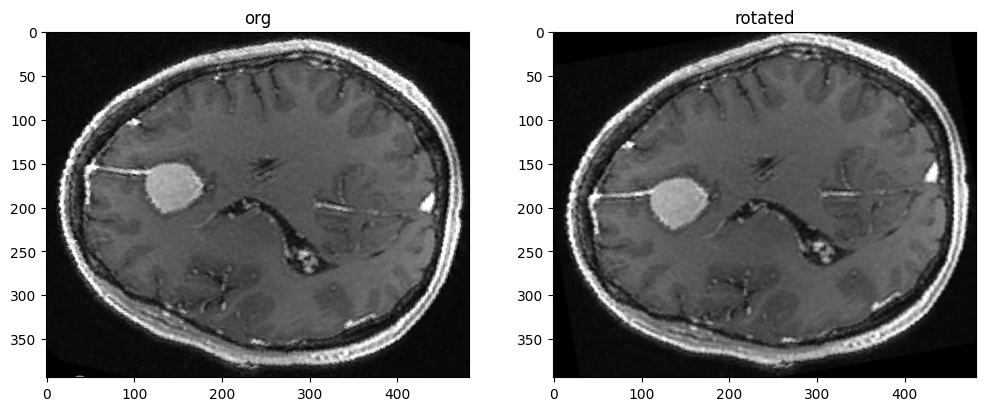

In [ ]:
plot2Images(imgTest,rotated_image,'org','rotated')

[[  0.98480759   0.1736642  -30.59292272]
 [ -0.1736642    0.98480759  44.89522521]]


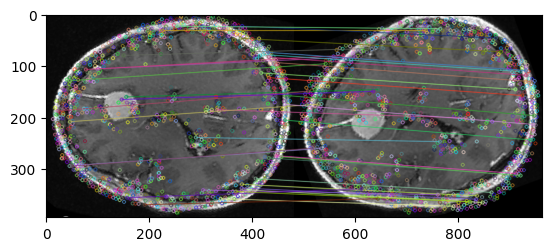

In [ ]:
imgSTr,TrMtx = computeAndPlotMatchingSift(rotated_image,imgTest,True)

In [ ]:
print(getRotationAngle(TrMtx))

10.000905769591853


## Loop Frame Find Best

### normalization


In [ ]:
def percentile_normalize(image, lower_percentile=2, upper_percentile=98):
    """
    Perform percentile normalization on an image.

    Args:
    image (numpy.ndarray): The input image as a NumPy array.
    lower_percentile (float): The lower percentile for normalization (default: 2).
    upper_percentile (float): The upper percentile for normalization (default: 98).

    Returns:
    numpy.ndarray: The percentile-normalized image in the uint8 (0-255) range.
    """

    # Calculate the lower and upper bounds based on the specified percentiles
    lower_bound = np.percentile(image, lower_percentile)
    upper_bound = np.percentile(image, upper_percentile)

    # Apply percentile normalization
    normalized_image = np.clip(image, lower_bound, upper_bound)
    normalized_image = (normalized_image - lower_bound) / (upper_bound - lower_bound)

    # Scale the normalized image to the uint8 range (0-255)
    normalized_image = (normalized_image * 255).astype(np.uint8)

    return normalized_image



Text(0.5, 1.0, 'Target')

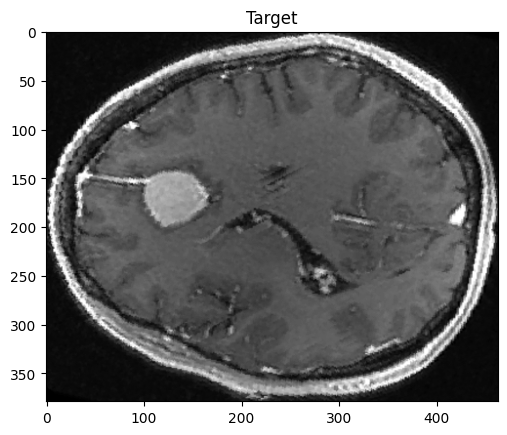

In [ ]:
plt.figure()
plt.imshow(image_target,cmap='gray')
plt.title('Target')

In [ ]:
# Assuming you have the ultrasound image in a NumPy array called "image"
# Convert to 8-bit image (if necessary)
image_8bit = cv2.convertScaleAbs(image_target)

# Apply histogram equalization
equalized_image_target = cv2.equalizeHist(image_8bit)

(0.0, 256.0)

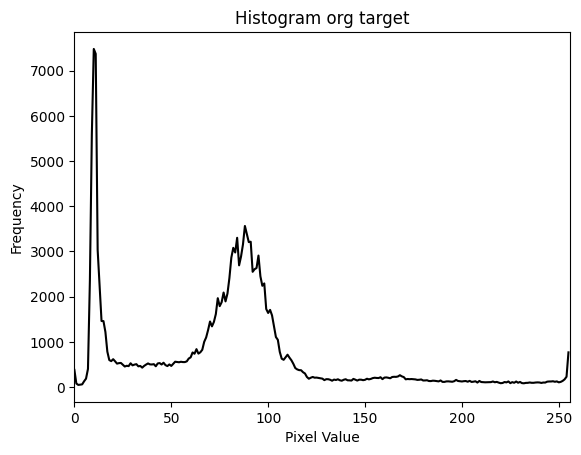

In [ ]:
# Calculate the histogram
hist = cv2.calcHist([image_target], [0], None, [256], [0, 256]).flatten()


# Plot the histogram
plt.figure()
plt.title("Histogram org target")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.plot(hist, color='black')
plt.xlim([0, 256])  # Set the x-axis limits (0 to 255 for 8-bit images)


(0.0, 256.0)

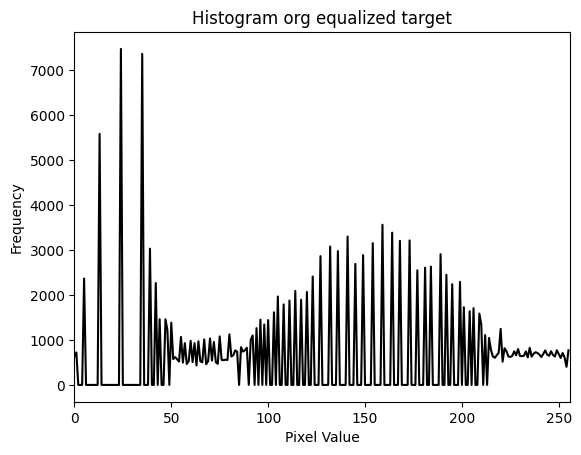

In [ ]:
# Calculate the histogram
hist = cv2.calcHist([equalized_image_target], [0], None, [256], [0, 256]).flatten()


# Plot the histogram
plt.figure()
plt.title("Histogram org equalized target")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.plot(hist, color='black')
plt.xlim([0, 256])  # Set the x-axis limits (0 to 255 for 8-bit images)

In [ ]:
plt.imshow(equalized_image_target,cmap='gray')
plt.title('equalized target')

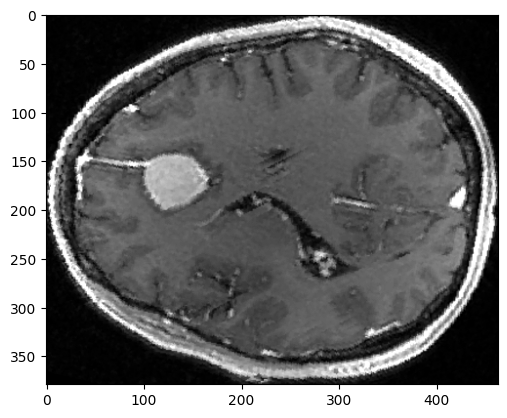

In [ ]:
image_target_normp = percentile_normalize(image_target)
plt.figure()
plt.imshow(image_target_normp,cmap='gray')

In [ ]:
image_target_normp.dtype

dtype('uint8')

(0.0, 256.0)

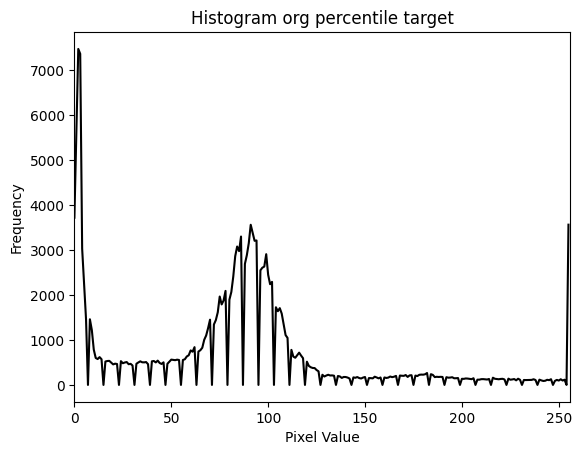

In [ ]:
# Calculate the histogram
hist = cv2.calcHist([image_target_normp], [0], None, [256], [0, 256]).flatten()


# Plot the histogram
plt.figure()
plt.title("Histogram org percentile target")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.plot(hist, color='black')
plt.xlim([0, 256])  # Set the x-axis limits (0 to 255 for 8-bit images)

## The actual loop score

In [ ]:
img=cv2.imread('task1.jpg',cv2.IMREAD_GRAYSCALE)
imgOrg=cropImageBlob(img)
image_target = imgOrg.astype(np.uint8)
image_target_normp = percentile_normalize(image_target)

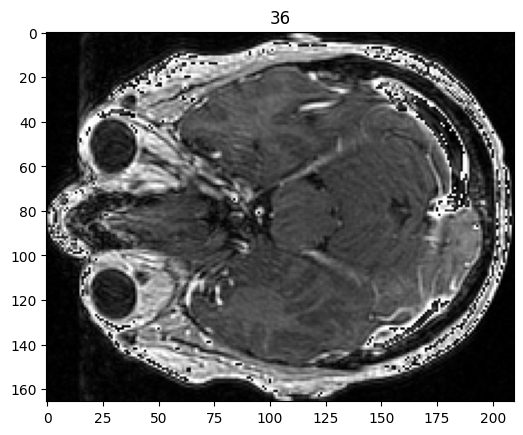

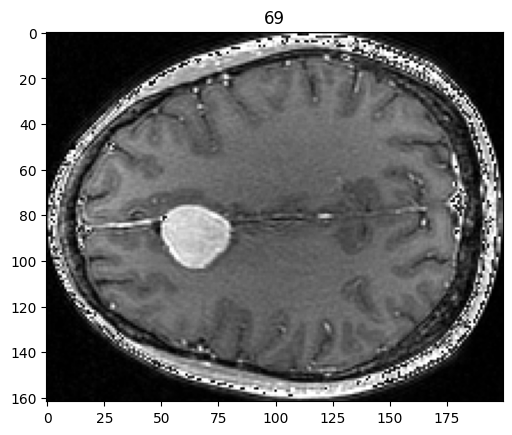

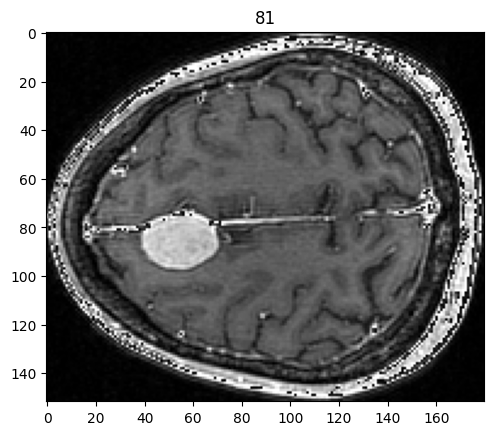

In [ ]:
results = []

for channel in range(readdata.shape[2]):
     # Extract the 256x256 slice for the current channel
     slice_256x256 = readdata[:, :, channel]
     #crop
     processed_slice = cropImageBlob(slice_256x256).astype(np.uint8)
     #plt.figure()
     #plt.imshow( processed_slice,cmap='gray')
     #plt.title(str(channel))

     #image_8bit_slice = cv2.convertScaleAbs(processed_slice)
     #equalized_image_slice = cv2.equalizeHist(image_8bit_slice)

     equalized_image_slice = percentile_normalize(processed_slice )



     # similarity
     #equalized_image_target
     result = get_score( image_target_normp,equalized_image_slice)

     if(result>0):
      plt.figure()
      plt.imshow( equalized_image_slice,cmap='gray')
      plt.title(str(channel))

     results.append(result)



Text(0, 0.5, 'score')

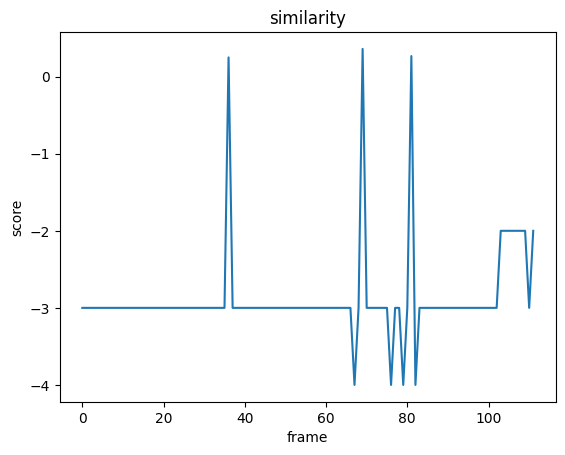

In [ ]:
plt.plot(results)
plt.title('similarity')
plt.xlabel('frame')
plt.ylabel('score')

In [ ]:
max(results)

0.3605321404827557

In [ ]:
max_index = results.index(max(results))
max_index

69

In [ ]:
# Find the indexes where A > 0
indexes = np.where(np.array(results) > 0)[0]

# Define N
N = readdata.shape[2]

# Create a list of values that are ind, ind-1, and ind+1 for each ind



In [ ]:
indexes

array([36, 69, 81])

In [ ]:
for i in indexes:
   print(results[i])

0.25045847030084506
0.3605321404827557
0.2675451476849958


In [ ]:
resultIndex = [i for ind in indexes for i in range(ind - 1, ind + 2) if i > 0 and i <= N]

In [ ]:
resultIndex

[35, 36, 37, 68, 69, 70, 80, 81, 82]

Text(0.5, 1.0, 'slice found')

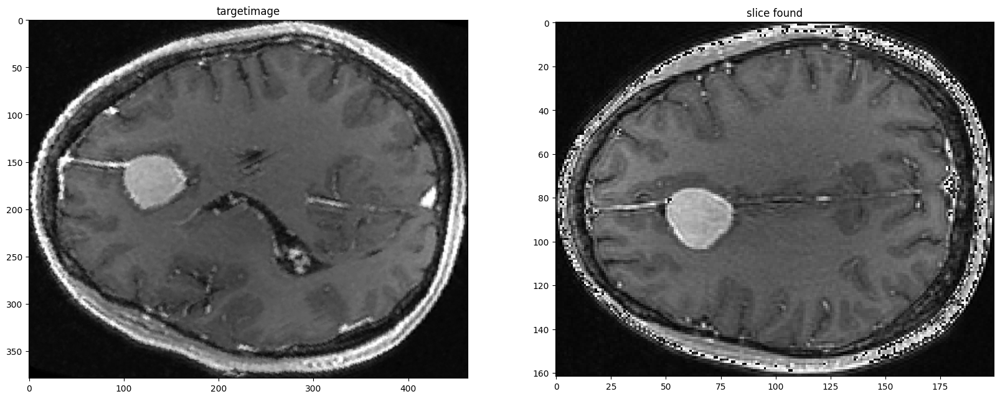

In [ ]:
plt.figure(figsize=(20, 10))

plt.subplot(1,2,1)
plt.imshow(image_target,cmap='gray')
plt.title('targetimage')

plt.subplot(1,2,2)
plt.imshow( cropImageBlob(readdata[:, :, max_index]).astype('uint8'),cmap='gray')
plt.title('slice found')

#### view match

[[  1.00802958   0.09567366 -19.96039278]
 [ -0.09567366   1.00802958  23.62812999]]


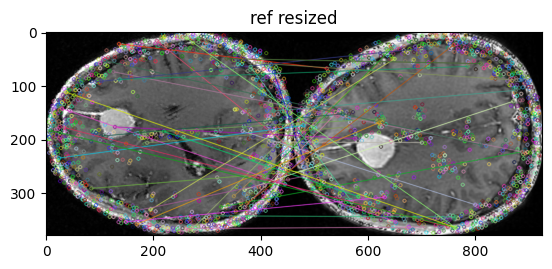

In [ ]:

slice_256x256 = readdata[:, :, max_index]
#crop
processed_slice = cropImageBlob(slice_256x256).astype(np.uint8)
equalized_image_slice = percentile_normalize(processed_slice )

# similarity
result = get_score( image_target_normp,equalized_image_slice,True)

### Full function Similarity

In [ ]:
def preProcessImage(ImageIn):
  #preprocess image

  imgCropped=cropImageBlob(ImageIn).astype(np.uint8)
  image_normp = percentile_normalize(imgCropped)

  return image_normp

In [ ]:
def getMatcheImage(fnameNRRd,imageGT):
  '''
  fnameNRRd : filename 3D NRRD File, nr*nc*nch volume data
  imageGT  :  Image (2D)

  return  Frame Id, Image (2D), Similarity
  '''

  #read 3D file
  readdata, header = nrrd.read('task1.nrrd')

  #normalazie and crop target image
  image_target_normp = preProcessImage(imageGT)

  results = []

  for channel in range(readdata.shape[2]):
      # Extract the 256x256 slice for the current channel
      slice_256x256 = readdata[:, :, channel]
      # normalize crop slice
      equalized_image_slice = preProcessImage(slice_256x256)

      # similarity
      result = get_score( image_target_normp,equalized_image_slice)

      '''
      if(result>0):
        plt.figure()
        plt.imshow( equalized_image_slice,cmap='gray')
        plt.title(str(channel))
      '''

      results.append(result)

  max_index = results.index(max(results))
  FrameId=max_index
  Score = results[max_index]
  BestImage = readdata[:, :, FrameId]

  #Frame Id, Image (2D), Similarity
  return FrameId, Score, BestImage



##Test Function

In [ ]:
imageGT=cv2.imread('task1.jpg',cv2.IMREAD_GRAYSCALE)

In [ ]:
fnameNRRd='task1.nrrd'

In [ ]:
FrameId, Score, BestImage = getMatcheImage(fnameNRRd,imageGT)

In [ ]:
print('Selected Frame',FrameId)
print('Score',Score)

Selected Frame 69
Score 0.3605321404827557


Text(0.5, 1.0, 'slice found')

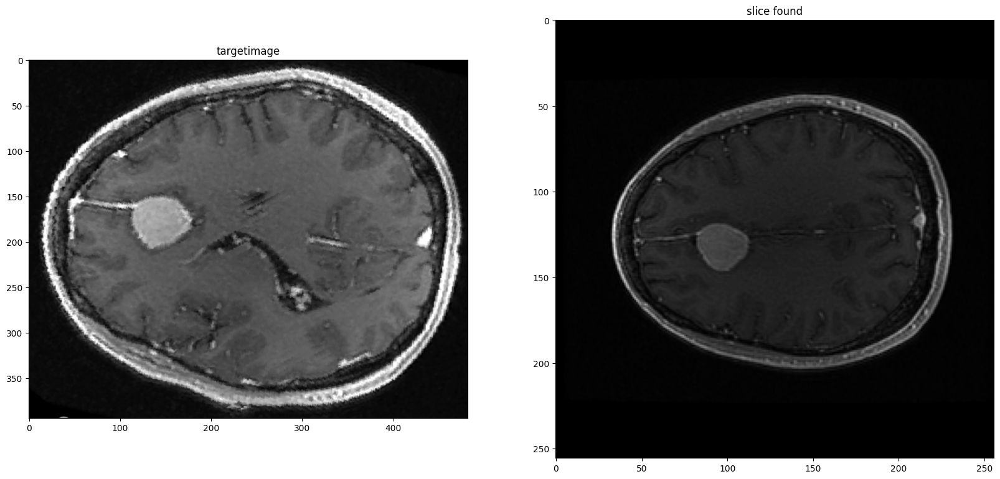

In [ ]:
plt.figure(figsize=(20, 10))

plt.subplot(1,2,1)
plt.imshow(imageGT,cmap='gray')
plt.title('targetimage')

plt.subplot(1,2,2)
plt.imshow( BestImage,cmap='gray')
plt.title('slice found')

Text(0.5, 1.0, 'slice found')

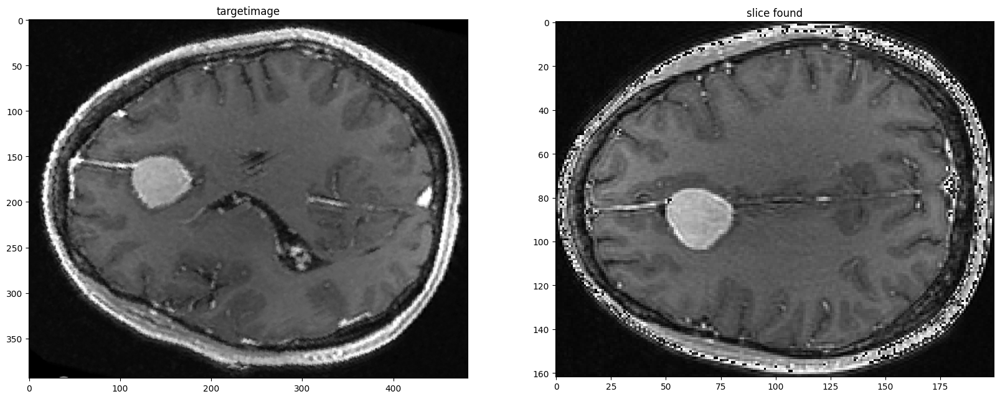

In [ ]:
plt.figure(figsize=(20, 10))

plt.subplot(1,2,1)
plt.imshow(imageGT,cmap='gray')
plt.title('targetimage')

plt.subplot(1,2,2)
plt.imshow( cropImageBlob(BestImage).astype('uint8'),cmap='gray')
plt.title('slice found')


# Check Slicing planes 3D

Im checking now if we need rotation aroundx,y,z to get better match

After consideration this is not what i need just rotate frame around axes , i will rotate full 3d volume and compare against !

### Rotate volume

In [ ]:
center = (100, 100, 50)
angles = (2, 3, -5)

In [ ]:
import numpy as np
from scipy.interpolate import interpn

def rotate_and_interpolate(array, point, angles):
    # Define the shape of the array
    shape = array.shape

    # Create a grid of coordinates
    x_coords, y_coords, z_coords = np.meshgrid(np.arange(shape[0]), np.arange(shape[1]), np.arange(shape[2]), indexing='ij')

    # Select the point
    x, y, z = point

    # Define rotation angles
    theta_x, theta_y, theta_z = np.radians(angles)

    # Calculate the coordinates of the points relative to the center
    x_rel = x_coords - x
    y_rel = y_coords - y
    z_rel = z_coords - z

    # Perform rotations
    x_rotated = x_rel * np.cos(theta_z) - y_rel * np.sin(theta_z)
    y_rotated = x_rel * np.sin(theta_z) + y_rel * np.cos(theta_z)
    z_rotated = z_rel

    x_rotated, y_rotated, z_rotated = x_rotated * np.cos(theta_y) + z_rotated * np.sin(theta_y), \
                                       y_rotated, \
                                       -x_rotated * np.sin(theta_y) + z_rotated * np.cos(theta_y)

    x_rotated, y_rotated, z_rotated = x_rotated, \
                                       y_rotated * np.cos(theta_x) - z_rotated * np.sin(theta_x), \
                                       y_rotated * np.sin(theta_x) + z_rotated * np.cos(theta_x)

    # Calculate the interpolated plane
    rotated_array = interpn((np.arange(shape[0]), np.arange(shape[1]), np.arange(shape[2])),
                            array,
                            (x_rotated + x, y_rotated + y, z_rotated + z),
                            method='linear', bounds_error=False, fill_value=0)

    return rotated_array


In [ ]:
center = (127, 127, 50)
angles = (2, 3, -5)

In [ ]:
rotplane = rotate_and_interpolate(readdata, center, angles)

In [ ]:
rotplane.shape

(256, 256, 112)

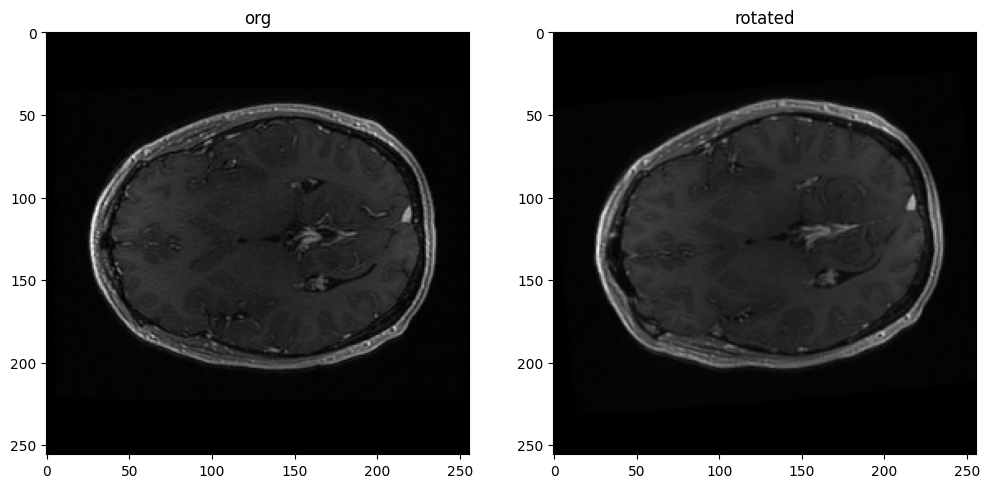

In [ ]:
plot2Images(readdata[:,:,50],rotplane[:,:,50] ,'org','rotated')

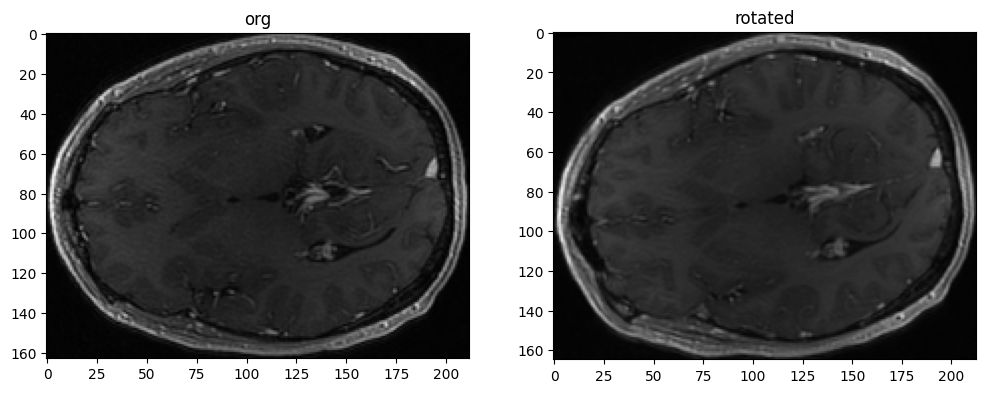

In [ ]:
plot2Images(cropImageBlob(readdata[:,:,50]),cropImageBlob(rotplane[:,:,50]) ,'org','rotated')

(165, 213)


Text(0.5, 1.0, 'crop rotated')

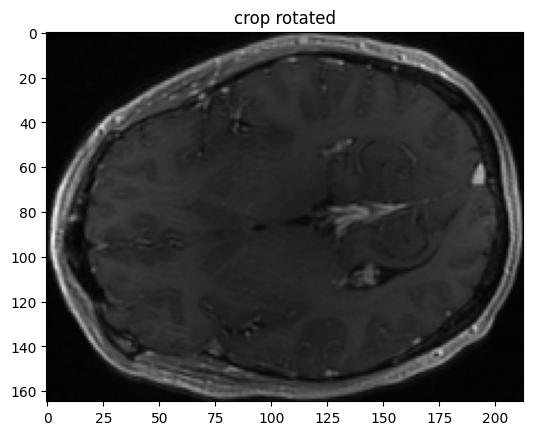

In [ ]:
cp = cropImageBlob(rotplane[:,:,50])
print(cp.shape)
plt.imshow(cp,cmap='gray')
plt.title('crop rotated')

##check more matches

In [ ]:
imageGT=cv2.imread('task1.jpg',cv2.IMREAD_GRAYSCALE)


In [ ]:
imageGT.dtype

dtype('uint8')

In [ ]:
imageGT.shape

(394, 482)

In [ ]:
fnameNRRd='task1.nrrd'

In [ ]:
def getMatcheImageVolume(imageGT,slice_256x256):
  '''
  readdata : the volume
  imageGT  :  Image (2D)

  return  Frame Id, Image (2D), Similarity
  '''

  # read 3D file
  # readdata, header = nrrd.read('task1.nrrd')

  #normalazie and crop target image
  image_target_normp = preProcessImage(imageGT)

  # normalize crop slice
  equalized_image_slice = preProcessImage(slice_256x256)

  # similarity

  result = get_score( image_target_normp,equalized_image_slice)

  '''
  if(result>0):
  plt.figure()
  plt.imshow( equalized_image_slice,cmap='gray')
  plt.title(str(channel))
  '''

  results.append(result)

  max_index = results.index(max(results))
  #FrameId=max_index
  Score = results[max_index]
  BestImage = slice_256x256#readdata[:, :, FrameId]

  #Frame Id, Image (2D), Similarity
  #return FrameId, Score, BestImage
  return  Score, BestImage

In [ ]:
hh,ww,nch=readdata.shape

In [ ]:
print(hh,ww,nch)

256 256 112


In [ ]:
center = (hh//2, ww//2, 12)
center

(128, 128, 12)

In [ ]:
import itertools

In [ ]:
angle_values = [-5,  0, 5]
# Generate all possible combinations of three angles
angle_combinations = list(itertools.product(angle_values, repeat=3))

In [ ]:
#angle_combinations

In [ ]:
AllFrames=[]
AllScore =[]
AllImages=[]
AllAngles=[]

for rind in resultIndex:

  center = (hh//2, ww//2, rind)
  #angles = (2, 3, -5)

  for angles in angle_combinations:
      rotplane = rotate_and_interpolate(readdata, center, angles)

      scaled_array = ((rotplane /rotplane.max()) * 255.0).astype('uint8')
      ScoreD, BestImageF  = getMatcheImageVolume(imageGT,scaled_array[:,:,rind])

      AllFrames.append(rind)
      AllScore.append(ScoreD)
      AllImages.append(BestImageF)
      AllAngles.append(angles)


Text(0.5, 1.0, 'scores rotated')

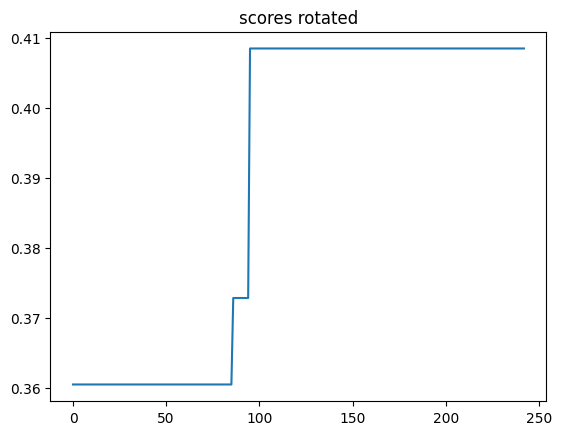

In [ ]:
plt.plot(AllScore)
plt.title('scores rotated')

In [ ]:
np.array(AllScore).max()

0.40845532952203

In [ ]:
max_index = AllScore.index(np.array(AllScore).max())

In [ ]:
max_index

95

In [ ]:
AllAngles[max_index]

(0, 0, 5)

In [ ]:
 FrameScore= np.array([AllFrames, AllScore]).T

In [ ]:
AllFrames[max_index]

68

In [ ]:
 FrameScore

array([[35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [35.        ,  0.36053214],
       [36.        ,  0.36053214],
       [36.        ,

Text(0.5, 1.0, 'score/frame')

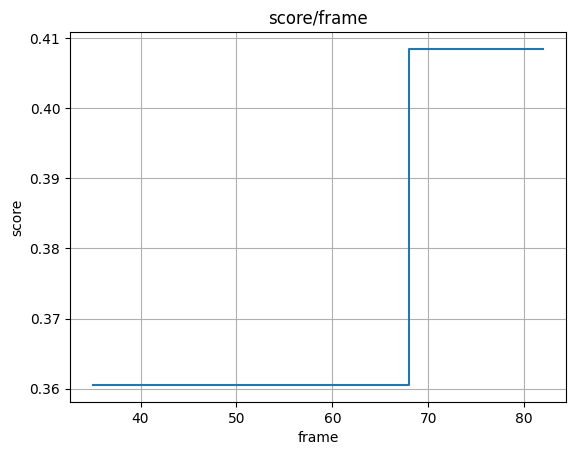

In [ ]:
plt.plot(AllFrames, AllScore)
plt.xlabel('frame')
plt.ylabel('score')
plt.grid(True)
plt.title('score/frame')

In [ ]:
#plot2Images(cropImageBlob(imageGT),cropImageBlob(AllImages[0]) ,'org','rotated')

In [ ]:
scaled_array.dtype

dtype('uint8')

In [ ]:
scaled_array.shape

(256, 256, 112)

In [ ]:
rotplane.dtype

dtype('float64')

we can reach higher score but remain with same frame selected.

# References



1.   https://elisach.medium.com/interactive-3d-ct-slices-visualisation-in-google-colab-2808892c55a7
2.   https://en.wikipedia.org/wiki/Structural_similarity
3.  https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html
4.   https://datahacker.rs/feature-matching-methods-comparison-in-opencv/
5.https://medium.com/@susanne.schmid/image-normalization-in-medical-imaging-f586c8526bd1
6.https://www.mathworks.com/help/medical-imaging/ug/medical-image-registration.html
7.






